In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pyplot import figure
from matplotlib.pyplot import suptitle
import matplotlib.style as style
from IPython.display import display, HTML
import warnings
%config InlineBackend.figure_format = 'png' #set 'png' here when working on notebook
warnings.filterwarnings('ignore') 

# Set some parameters to get good visuals - style to ggplot and size to 15,10

pd.set_option('display.width',170, 'display.max_rows',200, 'display.max_columns',900)

In [2]:
df = pd.read_csv("/Users/pvaish10/Desktop/TADPOLE_D1_D2.csv")

In [3]:
df1 = df[['RID', 'PTID', 'VISCODE','D1', 'D2','DX','EXAMDATE','Years_bl','Month','AGE', 'PTGENDER', 'PTEDUCAT', 'PTETHCAT', 'PTRACCAT', 'PTMARRY', 'APOE4', 'FDG','AV45',
         'CDRSB','ADAS11','MMSE', 'RAVLT_immediate','Hippocampus', 'WholeBrain','Entorhinal', 'MidTemp','ABETA_UPENNBIOMK9_04_19_17',
         'TAU_UPENNBIOMK9_04_19_17','PTAU_UPENNBIOMK9_04_19_17']]

In [4]:
df1.head(1)

,RID,PTID,VISCODE,D1,D2,DX,EXAMDATE,Years_bl,Month,AGE,PTGENDER,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,FDG,AV45,CDRSB,ADAS11,MMSE,RAVLT_immediate,Hippocampus,WholeBrain,Entorhinal,MidTemp,ABETA_UPENNBIOMK9_04_19_17,TAU_UPENNBIOMK9_04_19_17,PTAU_UPENNBIOMK9_04_19_17
0,2,011_S_0002,bl,1,1,NL,2005-09-08,0.0,0,74.3,Male,16,Not Hisp/Latino,White,Married,0.0,1.36926,NaN,0.0,10.67,28.0,44.0,8336.0,1229740.0,4177.0,27936.0,,,


In [5]:
df1['DX'].value_counts()

MCI                3932
NL                 2668
Dementia           1732
MCI to Dementia     372
NL to MCI           108
MCI to NL            77
Dementia to MCI      12
NL to Dementia        3
Name: DX, dtype: int64

In [6]:
df1['DX'] = df1['DX'].fillna("Unknown")

In [7]:
df1['DX'].value_counts()

MCI                3932
Unknown            3837
NL                 2668
Dementia           1732
MCI to Dementia     372
NL to MCI           108
MCI to NL            77
Dementia to MCI      12
NL to Dementia        3
Name: DX, dtype: int64

#### Update the age as per the exam and diagnosis

In [8]:
df1['AGE_UPDATED'] = np.round(df1['AGE'] + df1['Years_bl'], 2)

In [9]:
df1['ABETA_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df1['ABETA_UPENNBIOMK9_04_19_17'], errors='coerce')
df1['TAU_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df1['TAU_UPENNBIOMK9_04_19_17'], errors='coerce')
df1['PTAU_UPENNBIOMK9_04_19_17'] = pd.to_numeric(df1['PTAU_UPENNBIOMK9_04_19_17'], errors='coerce')

In [10]:
df3 = df1[['D1', 'D2', 'DX',  'PTGENDER', 'PTEDUCAT', 'APOE4', 'FDG',
       'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp', 'ABETA_UPENNBIOMK9_04_19_17',
       'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED']]

In [11]:
df3['DX'].unique()

array(['NL', 'Dementia', 'MCI', 'NL to MCI', 'MCI to Dementia',
       'MCI to NL', 'Dementia to MCI', 'Unknown', 'NL to Dementia'],
      dtype=object)

##### 'NL' : 1,  'NL to MCI' : 2 , 'NL to Dementia' : 3 , 'MCI' : 4, 'MCI to NL' : 5, 'MCI to Dementia' : 6,
##### 'Dementia to MCI' : 7, 'Dementia' : 8 , 'Unknown' : 9

In [12]:
df3 = df3.replace({'NL' : 1,  'NL to MCI' : 2 , 'NL to Dementia' : 3 , 'MCI' : 4, 'MCI to NL' : 5, 'MCI to Dementia' : 6,
        'Dementia to MCI' : 7, 'Dementia' : 8 , 'Unknown' : 9 })

In [13]:
categorial_cols = [
    'PTGENDER']

for cc in categorial_cols:
    dummies = pd.get_dummies(df3[cc])
    dummies = dummies.add_prefix("{}#".format(cc))
    df3.drop(cc, axis=1, inplace=True)
    df3 = df3.join(dummies)

In [14]:
df3.columns

Index(['D1', 'D2', 'DX', 'PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male'],
      dtype='object')

In [15]:
predictors = ['D1', 'D2','PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']


In [16]:
train_X = df3[predictors][df3['D1'] == 1]
train_X = train_X[['PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']]
test_X = df3[predictors][df3['D2'] == 1]
test_X = test_X[['PTEDUCAT', 'APOE4', 'FDG', 'AV45', 'CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'Hippocampus', 'WholeBrain', 'Entorhinal', 'MidTemp',
       'ABETA_UPENNBIOMK9_04_19_17', 'TAU_UPENNBIOMK9_04_19_17', 'PTAU_UPENNBIOMK9_04_19_17', 'AGE_UPDATED', 'PTGENDER#Female', 'PTGENDER#Male']]


train_y = df3.DX[df3['D1'] == 1]
test_y = df3.DX[df3['D2'] == 1]

In [17]:
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import Imputer
from sklearn.metrics import mean_absolute_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.multiclass import OneVsRestClassifier

In [18]:
#!pip install xgboost

In [19]:
#Impute missing values after train test split
my_imputer = SimpleImputer()
train_X_imputed = pd.DataFrame(my_imputer.fit_transform(train_X.values))
test_X_imputed = pd.DataFrame(my_imputer.fit_transform(test_X.values))


In [20]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_X_scaled=scaler.fit_transform(train_X_imputed)
test_X_scaled=scaler.fit_transform(test_X_imputed)

In [21]:
from sklearn.metrics import roc_auc_score
def multiclass_roc_dict(y_test,y_pred):
    #creating a set of all the unique classes using the actual class list
    unique_class = set(y_test.values)
    roc_auc_dict = {}
    for per_class in unique_class:
        #creating a list of all the classes except the current class 
        other_class = [x for x in unique_class if x != per_class]

        #marking the current class as 1 and all other classes as 0
        new_actual_class = [0 if x in other_class else 1 for x in y_test]
        new_pred_class = [0 if x in other_class else 1 for x in y_pred]

        #using the sklearn metrics method to calculate the roc_auc_score
        roc_auc = roc_auc_score(new_actual_class, new_pred_class, average = 'macro')
        roc_auc_dict[per_class] = roc_auc
    return roc_auc_dict

In [22]:
# Decision Tree
def get_multiclass_roc_dict(max_leaf_nodes, train_X, test_X, train_y, test_y):
    model = DecisionTreeClassifier(max_leaf_nodes=max_leaf_nodes, random_state=0)
    model.fit(train_X, train_y)
    preds_y = model.predict(test_X)
    multiclass_roc = multiclass_roc_dict(test_y, preds_y)
    return(multiclass_roc)

In [23]:
print("Decision Tree results with different number of leaf nodes:")
for max_leaf_nodes in [5, 50, 500, 5000,50000]:
    my_multiclass_roc_dict = get_multiclass_roc_dict(max_leaf_nodes, train_X_scaled, test_X_scaled, train_y, test_y)
    print("Max leaf nodes: %d" %(max_leaf_nodes))
    print(my_multiclass_roc_dict)

Decision Tree results with different number of leaf nodes:
Max leaf nodes: 5
{1: 0.5, 2: 0.5, 3: 0.5, 4: 0.6453021229351941, 5: 0.5, 6: 0.5, 7: 0.5, 8: 0.9241704028091595, 9: 0.9327479400001135}
Max leaf nodes: 50
{1: 0.6258885945022071, 2: 0.5, 3: 0.5, 4: 0.756121144210046, 5: 0.5, 6: 0.5054680358851106, 7: 0.5, 8: 0.9340609704331672, 9: 0.9837156134770331}
Max leaf nodes: 500
{1: 0.6251161573722053, 2: 0.5396210379379495, 3: 0.49986943465204337, 4: 0.7164737637164577, 5: 0.5076696753814671, 6: 0.532207566053006, 7: 0.4996734160679295, 8: 0.9163128105096969, 9: 0.9824928890611071}
Max leaf nodes: 5000
{1: 0.6344696278038814, 2: 0.5662540762298818, 3: 0.4997388693040867, 4: 0.6989621265609182, 5: 0.5062219259737283, 6: 0.5943567611093518, 7: 0.49908556499020246, 8: 0.8845307668797108, 9: 0.9759171716717527}
Max leaf nodes: 50000
{1: 0.6344696278038814, 2: 0.5662540762298818, 3: 0.4997388693040867, 4: 0.6989621265609182, 5: 0.5062219259737283, 6: 0.5943567611093518, 7: 0.499085564990202

In [24]:
# Random Forest
forest_model = OneVsRestClassifier(RandomForestClassifier(random_state=99))
forest_model.fit(train_X_scaled, train_y)
preds_y = forest_model.predict(test_X_scaled)
print("Random Forest Results")
print(multiclass_roc_dict(test_y, preds_y))

Random Forest Results
{1: 0.5696939811978254, 2: 0.49986809128083365, 3: 0.5, 4: 0.7465217740428751, 5: 0.5, 6: 0.5320749976882369, 7: 0.5, 8: 0.9480523472760748, 9: 0.9888609358394665}


In [25]:
# XGBoost
my_pipeline = make_pipeline(SimpleImputer(),OneVsRestClassifier(XGBClassifier()))
my_pipeline.fit(train_X_scaled, train_y)
preds_y = my_pipeline.predict(test_X_scaled)
print("XGBoost Results")
print(multiclass_roc_dict(test_y, preds_y))

XGBoost Results
{1: 0.554538367678659, 2: 0.5, 3: 0.5, 4: 0.7475523785947205, 5: 0.5, 6: 0.5180714412554388, 7: 0.5, 8: 0.9424751231890091, 9: 0.989095134144168}


In [26]:
# XGBoost with parameters tuning 
xgb_model = OneVsRestClassifier(XGBClassifier(n_estimators=1000))
xgb_model.fit(train_X_scaled, train_y)
preds_y = xgb_model.predict(test_X_scaled)
print("XGBoost Results with Parameter Tuning")
print(multiclass_roc_dict(test_y, preds_y))

XGBoost Results with Parameter Tuning
{1: 0.6307869008174101, 2: 0.5062631595644675, 3: 0.5, 4: 0.7749957968075712, 5: 0.5, 6: 0.5337419221267239, 7: 0.5, 8: 0.9510998981894428, 9: 0.9887889765530194}


In [41]:
from sklearn.metrics import classification_report
# XGBoost with parameters tuning 
xgb_model = OneVsRestClassifier(XGBClassifier(n_estimators=100))
xgb_model.fit(train_X_scaled, train_y)
preds_y = xgb_model.predict(test_X_scaled)
print("Classification Report : {}".format(classification_report(test_y, preds_y,  labels=[1, 2, 3,4,5,6,7,8,9])))

Classification Report :               precision    recall  f1-score   support

           1       0.92      0.13      0.23      1997
           2       0.00      0.00      0.00        79
           3       0.00      0.00      0.00         1
           4       0.52      0.86      0.65      2397
           5       0.00      0.00      0.00        62
           6       0.29      0.01      0.02       163
           7       0.00      0.00      0.00         5
           8       0.50      0.94      0.65       473
           9       0.99      0.98      0.99      2483

   micro avg       0.68      0.68      0.68      7660
   macro avg       0.36      0.33      0.28      7660
weighted avg       0.76      0.68      0.62      7660



Confusion matrix, without normalization
[[ 267    0    0 1728    0    0    0    0    2]
 [   1    0    0   74    0    1    0    2    1]
 [   0    0    0    0    0    0    0    1    0]
 [  19    0    0 2071    0    3    0  294   10]
 [   1    0    0   61    0    0    0    0    0]
 [   0    0    0   15    0    2    0  145    1]
 [   0    0    0    5    0    0    0    0    0]
 [   0    0    0   24    0    1    0  445    3]
 [   1    0    0   38    0    0    0    8 2436]]
Normalized confusion matrix
[[1.34e-01 0.00e+00 0.00e+00 8.65e-01 0.00e+00 0.00e+00 0.00e+00 0.00e+00
  1.00e-03]
 [1.27e-02 0.00e+00 0.00e+00 9.37e-01 0.00e+00 1.27e-02 0.00e+00 2.53e-02
  1.27e-02]
 [0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 0.00e+00 1.00e+00
  0.00e+00]
 [7.93e-03 0.00e+00 0.00e+00 8.64e-01 0.00e+00 1.25e-03 0.00e+00 1.23e-01
  4.17e-03]
 [1.61e-02 0.00e+00 0.00e+00 9.84e-01 0.00e+00 0.00e+00 0.00e+00 0.00e+00
  0.00e+00]
 [0.00e+00 0.00e+00 0.00e+00 9.20e-02 0.00e+00 1.23e-02 0.00e+00 8.90

<Figure size 432x288 with 0 Axes>

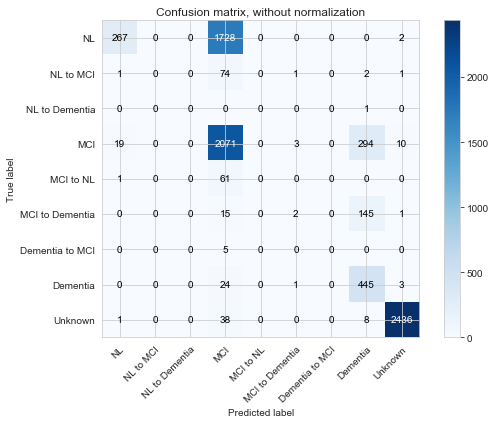

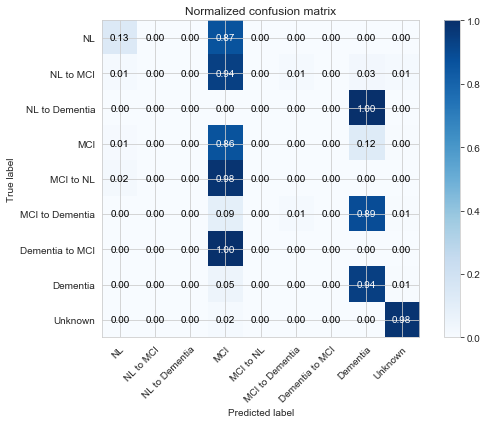

In [42]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
sns.set_style("whitegrid")
sns.despine()
class_names = ['NL' ,  'NL to MCI' , 'NL to Dementia'  , 'MCI' , 'MCI to NL' , 'MCI to Dementia',
        'Dementia to MCI' , 'Dementia'  , 'Unknown']

def plot_confusion_matrix(y_true, y_pred,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = unique_labels(df3['DX'])
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots(figsize = (8,6))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels= class_names, yticklabels= class_names,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(test_y, preds_y,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(test_y, preds_y, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

<Figure size 432x288 with 0 Axes>

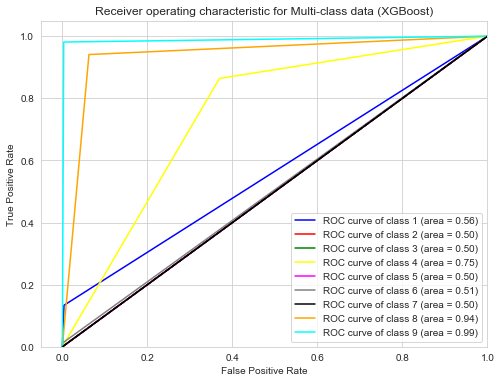

In [43]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

sns.set_style("whitegrid")
sns.despine()
fig,ax = plt.subplots(figsize = (8,6))

# Binarize the output
y_bin = label_binarize(test_y, classes=[1, 2,3,4,5,6,7,8,9])
n_classes = y_bin.shape[1]

y_score = label_binarize(preds_y, classes=[1, 2,3,4,5,6,7,8,9])


fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['blue', 'red', 'green','yellow','magenta', 'grey','black', 'orange', 'cyan']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i + 1, roc_auc[i] ))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for Multi-class data (XGBoost)')
plt.legend(loc="lower right")
plt.show()

### Code:
    https://www.kaggle.com/akshita72/alzheimers-prediction

In [44]:
#!pip install shap

### https://github.com/slundberg/shap

In [45]:
import shap
import xgboost

# load JS visualization code to notebook
shap.initjs()

model = xgboost.train({"learning_rate": 0.01, "n_estimators": 100, "eval_set":[(test_X_scaled, test_y)] }, xgboost.DMatrix(train_X_scaled, train_y), 100)

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_X)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], train_X.iloc[0,:])

In [46]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, train_X)

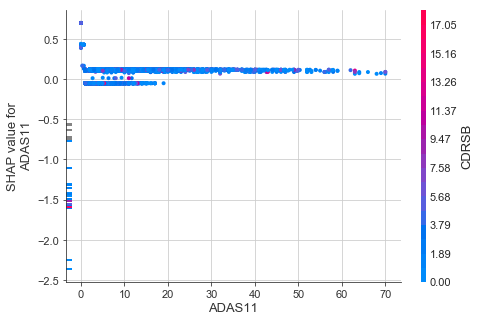

In [47]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("ADAS11", shap_values, train_X)

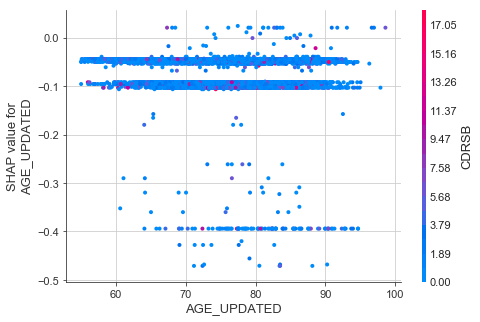

In [48]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("AGE_UPDATED", shap_values, train_X)

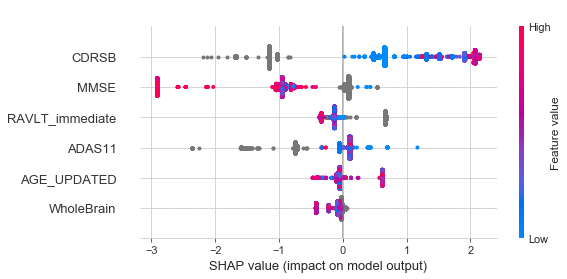

In [49]:
# summarize the effects of all the features
shap.summary_plot(shap_values, train_X)

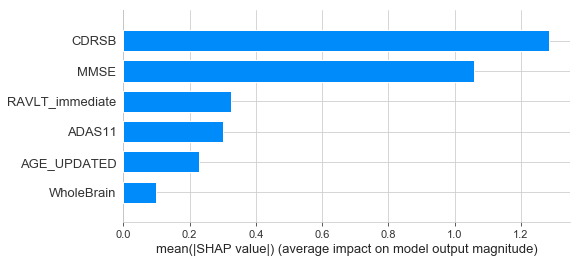

In [50]:
shap.summary_plot(shap_values, train_X, plot_type="bar")

#### Reduce Features

In [51]:
train_X = df3[predictors][df3['D1'] == 1]
train_X = train_X[['CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'WholeBrain',  'AGE_UPDATED']]
test_X = df3[predictors][df3['D2'] == 1]
test_X = test_X[['CDRSB', 'ADAS11', 'MMSE', 'RAVLT_immediate', 'WholeBrain',  'AGE_UPDATED']]


train_y = df3.DX[df3['D1'] == 1]
test_y = df3.DX[df3['D2'] == 1]

In [52]:
#Impute missing values after train test split
my_imputer = SimpleImputer()
train_X_imputed = pd.DataFrame(my_imputer.fit_transform(train_X.values))
test_X_imputed = pd.DataFrame(my_imputer.fit_transform(test_X.values))

In [53]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train_X_scaled = scaler.fit_transform(train_X_imputed)
test_X_scaled = scaler.fit_transform(test_X_imputed)

In [62]:
# XGBoost with parameters tuning 
xgb_model = OneVsRestClassifier(XGBClassifier(n_estimators=100))
xgb_model.fit(train_X_scaled, train_y) 
preds_y = xgb_model.predict(test_X_scaled)
print("XGBoost Results with Parameter Tuning")
print(multiclass_roc_dict(test_y, preds_y))

XGBoost Results with Parameter Tuning
{1: 0.5649078420739002, 2: 0.5, 3: 0.5, 4: 0.74721778783109, 5: 0.5, 6: 0.505801502605132, 7: 0.5, 8: 0.9390951656605728, 9: 0.9888937648328511}


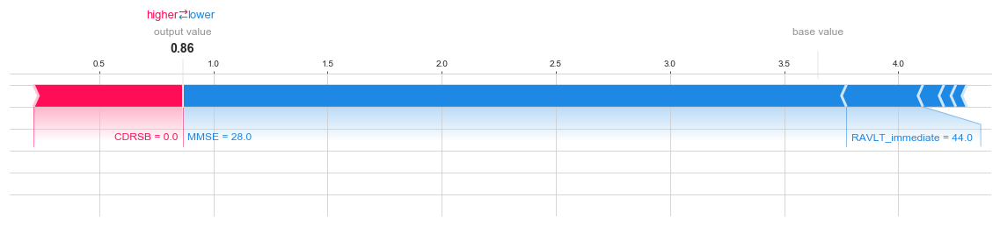

In [55]:
import shap
import xgboost

# load JS visualization code to notebook
shap.initjs()

model = xgboost.train({"learning_rate": 0.01, "n_estimators": 100, "eval_set":[(test_X_scaled, test_y)] }, xgboost.DMatrix(train_X_scaled, train_y), 100)

# explain the model's predictions using SHAP values
# (same syntax works for LightGBM, CatBoost, and scikit-learn models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_X)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], train_X.iloc[0,:],matplotlib=True)

In [56]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, train_X)

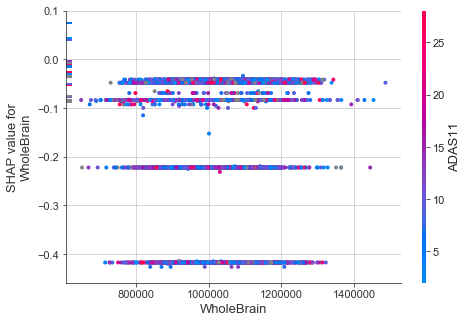

In [57]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("WholeBrain", shap_values, train_X)

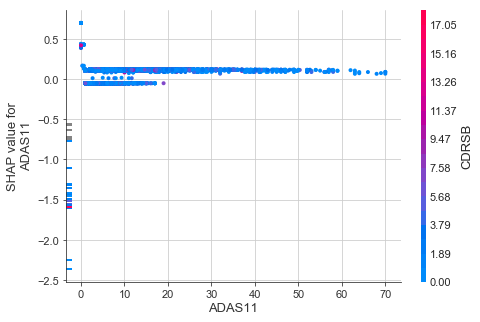

In [58]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("ADAS11", shap_values, train_X)

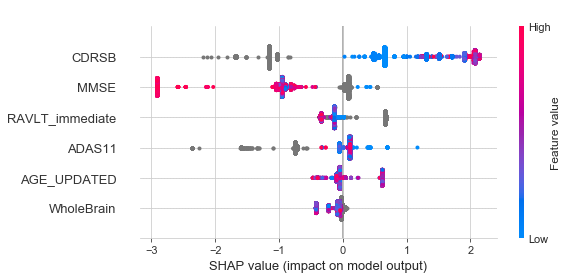

In [59]:
# summarize the effects of all the features
shap.summary_plot(shap_values, train_X)

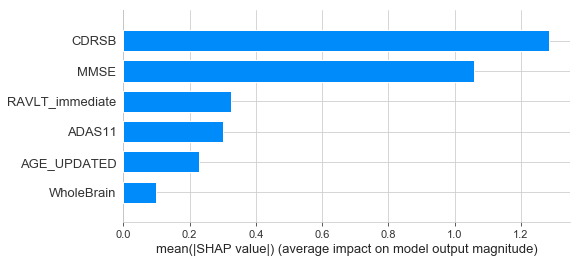

In [60]:
shap.summary_plot(shap_values, train_X, plot_type="bar")